<a href="https://colab.research.google.com/github/JacquiePersha/BuildingPermits/blob/main/02_image_augmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Objective

To illustrate the central ideas of image augmentation in the context of transfer learning using convolutional neural networks

In [1]:
! pip install --quiet imageio imgaug==0.4.0 session-info tensorboard-plugin-profile

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.6/83.6 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.5 MB/s eta 0:00:00


In [1]:
!pip install numpy==1.26.4 scipy==1.11.4 imgaug --upgrade --force-reinstall

  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
  Using cached scipy-1.11.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached imgaug-0.4.0-py2.py3-none-any.whl.metadata (1.8 kB)
  Using cached six-1.17.0-py2.py3-none-any.whl.metadata (1.7 kB)
  Using cached pillow-11.3.0-cp311-cp311-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (9.0 kB)
  Using cached matplotlib-3.10.5-cp311-cp311-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (11 kB)
  Using cached scikit_image-0.25.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (14 kB)
  Using cached opencv_python-4.12.0.88-cp37-abi3-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (19 kB)
  Using cached imageio-2.37.0-py3-none-any.whl.metadata (5.2 kB)
  Using cached shapely-2.1.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.7 kB)
  Using cached networkx-3.5-py3-none-any.whl.meta

/tmp/ipython-input-4264726082.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread('https://upload.wikimedia.org/wikipedia/commons/thumb/8/84/Example.svg/600px-Example.svg.png')


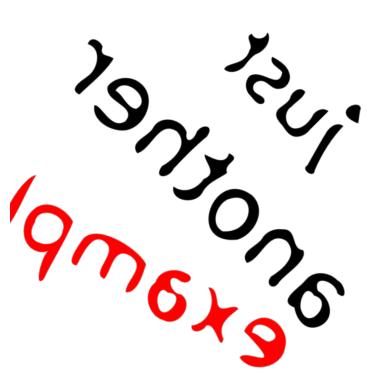

In [3]:
import numpy as np
import imageio
import imgaug as ia
from imgaug import augmenters as iaa
import matplotlib.pyplot as plt

image = imageio.imread('https://upload.wikimedia.org/wikipedia/commons/thumb/8/84/Example.svg/600px-Example.svg.png')
seq = iaa.Sequential([iaa.Fliplr(1.0), iaa.Affine(rotate=45)])

aug_image = seq(image=image)
plt.imshow(aug_image)
plt.axis('off')
plt.show()


In [1]:
#!pip install imgaug

In [4]:
import os
import random
import imageio
import secrets
import session_info


import numpy as np
import imgaug as ia
import tensorflow as tf

import matplotlib.pyplot as plt

from imgaug import augmenters as iaa
from collections import Counter

from io import BytesIO
from urllib.request import urlopen
from zipfile import ZipFile

from tqdm import tqdm

In [5]:
session_info.show()

KeyError: 'pybind11_abseil'

In [6]:
ia.seed(42)

The key idea to keep in mind in the context of image augmentation is:

>**What variations can we induce in the image while keeping the label invariant?**

Augmentations assume great importance in the context of transfer learning especially since the datasets are small. For transfer learning, it is more profitable to apply data augmentations separate from the model estimation process. That is, by treating data augmentation as a distinct preprocessing step we can strategically enhance the quality of the dataset.

# Data

So far, we have used the TensorFlow machinery to conduct exploratory data analysis on our images. However, augmentation is critially important for transfer learning and it needs far more attention than being a part of the training workflow. Let us begin however, with a recap of the data processing workflow we have seen in the previous notebook.

In [7]:
train_data_url = 'https://storage.googleapis.com/ibeans/train.zip'
validation_data_url = 'https://storage.googleapis.com/ibeans/validation.zip'
test_data_url = 'https://storage.googleapis.com/ibeans/test.zip'

In [8]:
with urlopen(train_data_url) as zipped_file:
    with ZipFile(BytesIO(zipped_file.read())) as zfile:
        zfile.extractall('/tmp/bean')

In [9]:
with urlopen(validation_data_url) as zipped_file:
    with ZipFile(BytesIO(zipped_file.read())) as zfile:
        zfile.extractall('/tmp/bean')

In [11]:
with urlopen(test_data_url) as zipped_file:
    with ZipFile(BytesIO(zipped_file.read())) as zfile:
        zfile.extractall('/tmp/bean')

In [12]:
TRAINING_DIR = '/tmp/bean/train'
VALIDATION_DIR = '/tmp/bean/validation'
TEST_DIR = '/tmp/bean/test'

BATCH_SIZE = 16

IMAGE_SIZE = (224, 224)

In [13]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TRAINING_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 1034 files belonging to 3 classes.


In [14]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=VALIDATION_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 133 files belonging to 3 classes.


In [15]:
class_names = np.array(train_ds.class_names)

In [16]:
class_names

array(['angular_leaf_spot', 'bean_rust', 'healthy'], dtype='<U17')

## EDA, enhanced

Start by looking at the most popular dimensions in your dataset. Doing this after running one loop of transfer learning helps contextualize the `input_shape` crop of the base model. The following code also allows us to diagnose if there are any malformed images in the dataset.

In [17]:
dimensions = []

for folder in os.listdir(TRAINING_DIR):
      for image in os.listdir(TRAINING_DIR + '/' + folder):
        img_path = os.path.join(TRAINING_DIR, folder, image)
        try:
            img = tf.keras.utils.load_img(img_path)
            input_arr = tf.keras.utils.img_to_array(img)
            dimensions.append(input_arr.shape)
        except Exception:
            print(f'Faulty image: {img_path}')

Faulty image: /tmp/bean/train/healthy/healthy_train.120tore


In [18]:
Counter(dimensions).most_common(10)

[((500, 500, 3), 1034)]

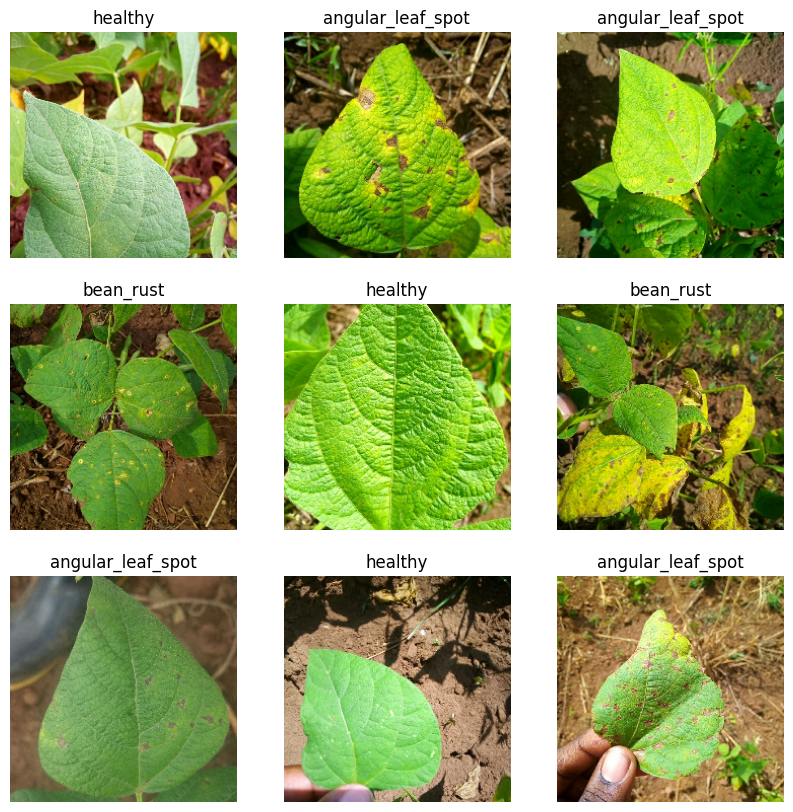

In [19]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[np.argmax(labels[i])])
    plt.axis("off")

What we observe in the exploratory data analysis has a direct bearing on the augmentation strategy. In general, we compose augmentations with the aim of improving the dataset.

# Augmentations

There are several important kind of augmentations that help build diversity into the dataset and help the model to be more robust. A validation dataset should be carved out once the transformation pipeline is built and the dataset is augmented.

Let us look at a few important augmentations that help in practise. These are rooted in empirical observations and hence the arguments on what each augmentation achieves is heuristic.

Broadly there are two outcomes of these augmentations:
- improved input quality
- increased model robustness


In [20]:
images = []

for folder in os.listdir(TRAINING_DIR):
    for image in os.listdir(TRAINING_DIR + '/' + folder):
        images.append(os.path.join(TRAINING_DIR, folder, image))

To help us visualize the impact of these transformations, let us build a function `plot_transform_output` that helps understand how the specific transformations change the input images (adapted from [here](https://github.com/kennethleungty/Data-Centric-AI-Competition/blob/main/Full_Notebook_Best_Submission.ipynb)).

In [21]:
def plot_transform_output(transformation_pipeline):

    '''
    Transformation is applied to a single image
    '''

    random_img = random.choice(images)

    img_original = imageio.imread(random_img)

    # Execute transformation

    img_transformed = transformation_pipeline(image=img_original)

    # Display images side by side
    fig = plt.figure(figsize=(14, 8))

    # show original image
    fig.add_subplot(221)
    plt.title('Original Image')
    plt.axis('off')
    plt.imshow(img_original)
    fig.add_subplot(222)
    plt.title('Transformed Image')
    plt.axis('off')
    plt.imshow(img_transformed)

Let us now run through a series of transformations observing the impact of these transformations on the input image.

## Improving Input Quality

### Linear Contrast

[Linear Contrast](https://imgaug.readthedocs.io/en/latest/source/overview/contrast.html#linearcontrast) adds "sharpness" to the image by scaling each pixel in the image.

In [22]:
transform_pipeline = iaa.LinearContrast((1.35, 1.75))

/tmp/ipython-input-3950704325.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(random_img)


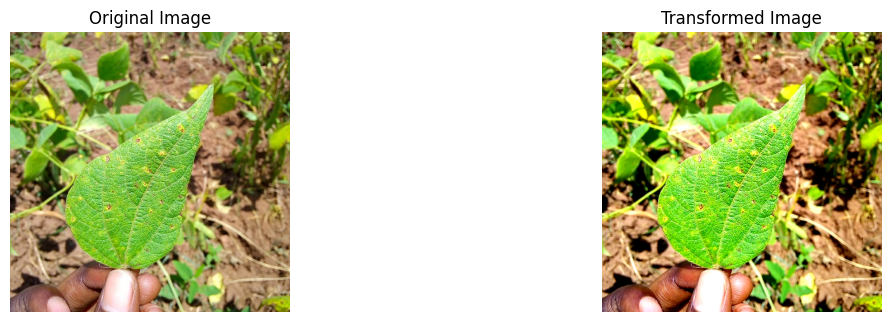

In [23]:
plot_transform_output(transform_pipeline)

### Multiply

We can selectively make some images brighter and some images lighter using a [multiplicative factor](https://imgaug.readthedocs.io/en/latest/source/overview/arithmetic.html#multiply) (for e.g., the example below amplifies 20% of images with a multiplicative factor between 0.8 and 1.2).

In [24]:
transform_pipeline = iaa.Multiply((0.8, 1.2), per_channel=0.2)

/tmp/ipython-input-3950704325.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(random_img)


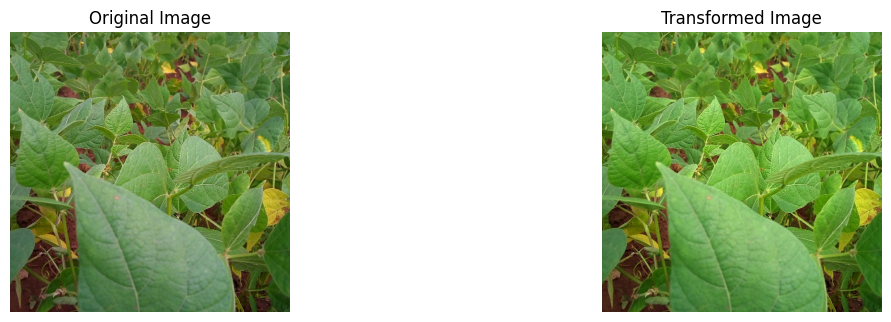

In [25]:
plot_transform_output(transform_pipeline)

## Increasing Model Robustness

### Resize

[Resize](https://imgaug.readthedocs.io/en/latest/source/api_augmenters_size.html#imgaug.augmenters.size.Resize) is very helpful when we "zoom" up the image. This is a neat trick that can be used to amplify the signal in the dataset (especially if the images have small dimensions).

In [26]:
transform_pipeline = iaa.Resize({"height": 400, "width": 400})

/tmp/ipython-input-3950704325.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(random_img)


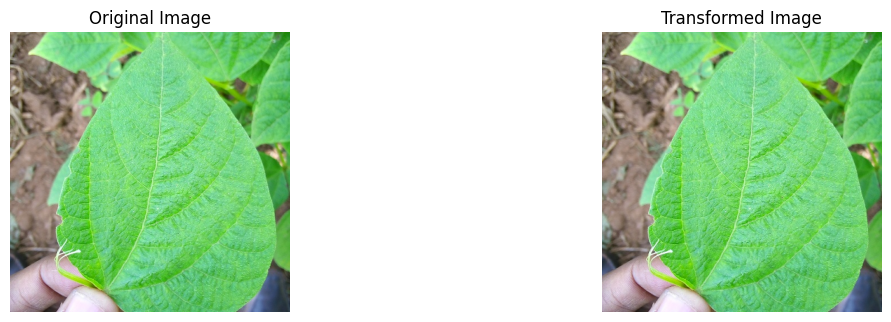

In [27]:
plot_transform_output(transform_pipeline)

### Crop

[Crops](https://imgaug.readthedocs.io/en/latest/source/api_augmenters_size.html?highlight=Crop#imgaug.augmenters.size.Crop) can be applied to the four sides of the image. This method adds robustness when there is lot of white space in the data. Depending on the white space, we could choose to crop a large portion of white space in the image. For example, in the code cell below, we are cropping each image randomly up to 5% of its width and height.

In [28]:
transform_pipeline = iaa.Crop(percent=(0, 0.05))

/tmp/ipython-input-3950704325.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(random_img)


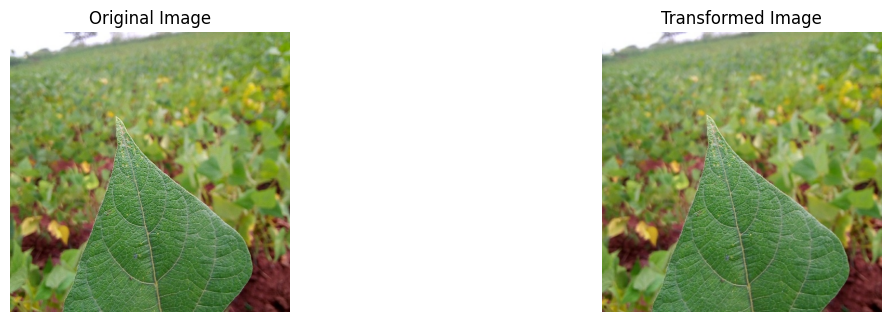

In [29]:
plot_transform_output(transform_pipeline)

### Blur

[Gaussian Blur](https://imgaug.readthedocs.io/en/latest/source/api_augmenters_blur.html#imgaug.augmenters.blur.GaussianBlur) is another method to introduce robustness to the model by blurring the image slightly. In this example, we use a sigma sampled randomly between 0 and 0.5 to blur an image (0 indicates no blur and 3.0 indicates maximum blur).

In [30]:
transform_pipeline = iaa.GaussianBlur(sigma=(0, 0.5))

/tmp/ipython-input-3950704325.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(random_img)


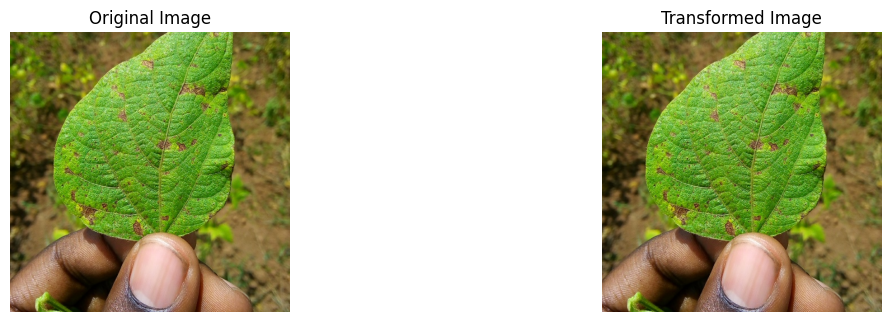

In [31]:
plot_transform_output(transform_pipeline)

### Additive Gaussian Noise

Selectively [adding white noise](https://imgaug.readthedocs.io/en/latest/source/overview/arithmetic.html?highlight=additive%20gaussian%20noise#additivegaussiannoise) adds to the robustness of the model by introducing a 'grainy' texture to the image.  

In [32]:
transform_pipeline = iaa.AdditiveGaussianNoise(loc=0,
                                               scale=(0.0, 0.05*255),
                                               per_channel=0.5)

/tmp/ipython-input-3950704325.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(random_img)


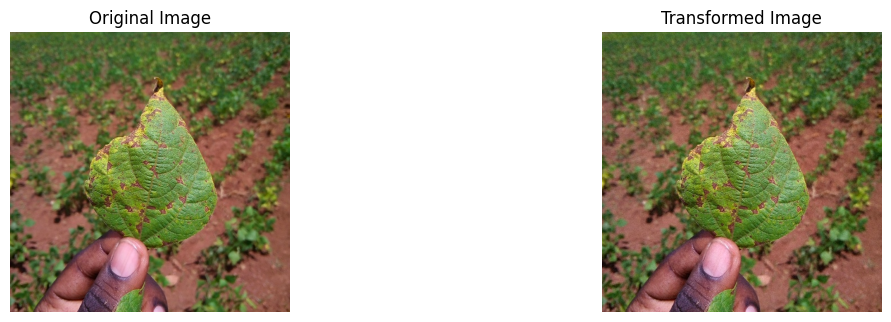

In [33]:
plot_transform_output(transform_pipeline)

### Affine Transformations

[Affine transformations](https://imgaug.readthedocs.io/en/latest/source/api_augmenters_geometric.html#imgaug.augmenters.geometric.Affine) induce minor variations in the inputs and help the model adapt to input variations.

In [34]:
transform_pipeline = iaa.Affine(scale={"x": (0.8, 1.2),
                                       "y": (0.8, 1.2)},
                                translate_percent={"x": (-0.06, 0.06), "y": (-0.06, 0.06)},
                                rotate=(-20, 20),
                                shear=(-3, 3),
                                cval=255) # Newly created pixels will be filled by white

/tmp/ipython-input-3950704325.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(random_img)


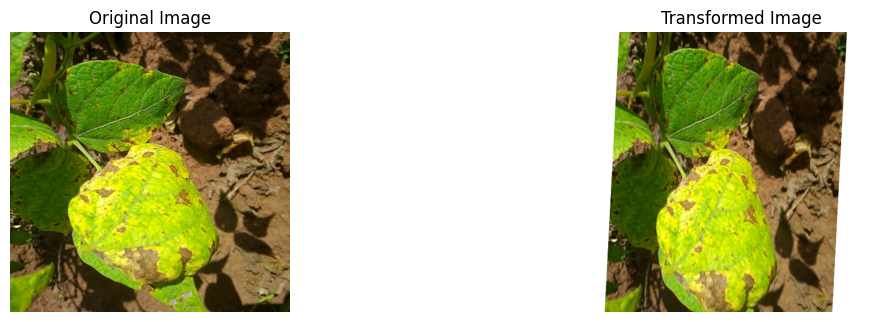

In [35]:
plot_transform_output(transform_pipeline)

### Cutout

Blocking portions of an image ([Cutout](https://imgaug.readthedocs.io/en/latest/source/overview/arithmetic.html?highlight=cutout#cutout)) is found to [increase the robustness](https://paperswithcode.com/paper/improved-regularization-of-convolutional) of the model.

In [36]:
transform_pipeline = iaa.Cutout(nb_iterations=2)

/tmp/ipython-input-3950704325.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(random_img)


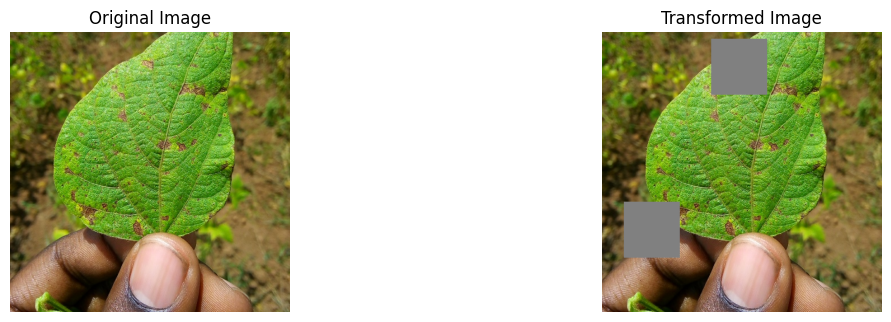

In [37]:
plot_transform_output(transform_pipeline)

## A Pipeline of Augmentations

Depending on the specifics of dataset on hand, a sequence of augmentations are usually composed. There is no one size fits all approach and efective data augmentation is currently receiving a lot of research attention from the computer vision ML community.

Here is a list of transformations that works in general.

In [38]:
transformation_pipeline = iaa.Sequential([iaa.Resize({"height": 400, "width": 400}),
                                          iaa.Crop(percent=(0, 0.05)),
                                          iaa.Sometimes(0.5,
                                                        iaa.GaussianBlur(sigma=(0, 0.5))),
                                          iaa.LinearContrast((1.35, 1.75)),
                                          iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255),
                                                                    per_channel=0.5),
                                          iaa.Multiply((0.8, 1.2), per_channel=0.2),
                                          iaa.Affine(scale={"x": (0.8, 1.2),
                                                            "y": (0.8, 1.2)},
                                                     translate_percent={"x": (-0.06, 0.06), "y": (-0.06, 0.06)},
                                                     rotate=(-20, 20),
                                                     shear=(-3, 3),
                                                     cval=255)],
                                         random_order=True)

/tmp/ipython-input-3950704325.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(random_img)


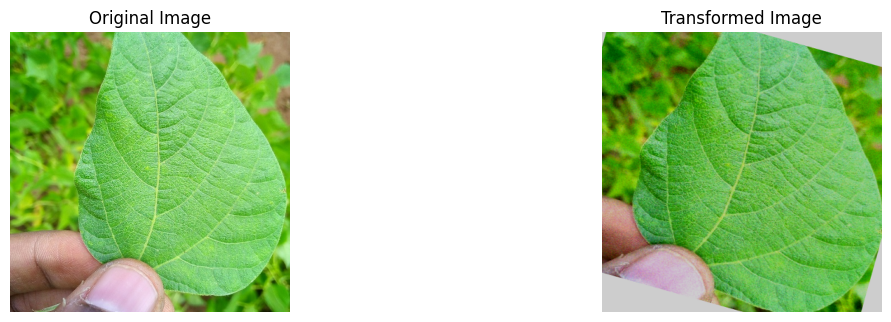

In [39]:
plot_transform_output(transformation_pipeline)

# Suggested Augmentation Workflow

In this section, we present and execute a data preprocessing workflow to improve the quality of training and validation data for the bean leaf disease dataset discussed so far in this workbook. While we show the application of this workflow on this data set, the following two step process works for any image dataset and is a key ingredient for robust (and improved) model performance.

1. Merge the images by class from the train data folder and validation data folder.
2. For each image in the merged data set create a set of augmented images using a transformation pipeline (here we will use the `transformation_pipeline` defined above to create 3 augmented images for each image).

In [40]:
! cp -r /tmp/bean/train /tmp/bean-augmented

In [41]:
! cp /tmp/bean/validation/angular_leaf_spot/* /tmp/bean-augmented/angular_leaf_spot

In [42]:
! cp /tmp/bean/validation/bean_rust/* /tmp/bean-augmented/bean_rust

In [43]:
! cp /tmp/bean/validation/healthy/* /tmp/bean-augmented/healthy

In [44]:
! ls /tmp/bean-augmented/

angular_leaf_spot  bean_rust  healthy


In [45]:
angular_leaf_spot_dir = '/tmp/bean-augmented/angular_leaf_spot'
bean_rust_dir = '/tmp/bean-augmented/bean_rust'
healthy_dir = '/tmp/bean-augmented/healthy'

In [46]:
NUM_AUGMENTATIONS = 3

## Angular Leaf Spot

In [47]:
focus_dir = angular_leaf_spot_dir

In [48]:
len(os.listdir(focus_dir))

389

In [49]:
images = []

for image in os.listdir(focus_dir):
    images.append(os.path.join(focus_dir, image))

In [50]:
faulty_images = []

In [51]:
for img in tqdm(images):

    try:
        # Read the original image
        img_original = imageio.imread(img)

        # Create the required number of augmentations by calling the transformation
        # pipeline. Save the augmented images to the same folder using a randomly
        # generated file name
        for _ in range(NUM_AUGMENTATIONS):
            imageio.imsave(os.path.join(focus_dir,
                                        secrets.token_hex(6) + '.png'),
                           transformation_pipeline(image=img_original))
    except Exception:
        # Catch all IO errors
        faulty_images.append(img)

  0%|          | 0/389 [00:00<?, ?it/s]/tmp/ipython-input-2968294838.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(img)
100%|██████████| 389/389 [01:12<00:00,  5.39it/s]


In [54]:
faulty_images = []

In [55]:
len(os.listdir(focus_dir))

1556

## Bean Rust

In [56]:
focus_dir = bean_rust_dir

In [57]:
len(os.listdir(focus_dir))

393

In [58]:
images = []

for image in os.listdir(focus_dir):
    images.append(os.path.join(focus_dir, image))

In [59]:
faulty_images = []

In [60]:
for img in tqdm(images):

    try:
        # Read the original image
        img_original = imageio.imread(img)

        # Create the required number of augmentations by calling the transformation
        # pipeline. Save the augmented images to the same folder using a randomly
        # generated file name
        for _ in range(NUM_AUGMENTATIONS):
            imageio.imsave(os.path.join(focus_dir,
                                        secrets.token_hex(6) + '.png'),
                           transformation_pipeline(image=img_original))
    except Exception:
        # Catch all IO errors
        faulty_images.append(img)

  0%|          | 0/393 [00:00<?, ?it/s]/tmp/ipython-input-2968294838.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(img)
100%|██████████| 393/393 [01:14<00:00,  5.30it/s]


In [61]:
faulty_images

[]

In [62]:
len(os.listdir(focus_dir))

1572

## Healthy

In [63]:
focus_dir = healthy_dir

In [64]:
len(os.listdir(focus_dir))

386

In [65]:
images = []

for image in os.listdir(focus_dir):
    images.append(os.path.join(focus_dir, image))

In [66]:
faulty_images = []

In [67]:
for img in tqdm(images):

    try:
        # Read the original image
        img_original = imageio.imread(img)

        # Create the required number of augmentations by calling the transformation
        # pipeline. Save the augmented images to the same folder using a randomly
        # generated file name
        for _ in range(NUM_AUGMENTATIONS):
            imageio.imsave(os.path.join(focus_dir,
                                        secrets.token_hex(6) + '.png'),
                           transformation_pipeline(image=img_original))
    except Exception:
        # Catch all IO errors
        faulty_images.append(img)

  0%|          | 0/386 [00:00<?, ?it/s]/tmp/ipython-input-2968294838.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(img)
 63%|██████▎   | 242/386 [00:48<01:08,  2.11it/s]/tmp/ipython-input-2968294838.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_original = imageio.imread(img)
100%|██████████| 386/386 [01:14<00:00,  5.17it/s]


In [68]:
faulty_images

['/tmp/bean-augmented/healthy/healthy_train.120tore']

In [69]:
len(os.listdir(focus_dir))

1541

# Model Training

There is no change in the model training process from what was presented in the previous notebook. The only difference here is that we now start with the augmented data instead of the original data. The augmented data is 3 times larger than the original data and is strategically assembled to improve model accuracy.

In [70]:
TRAINING_DIR = '/tmp/bean-augmented'

TEST_DIR = '/tmp/bean/test'

BATCH_SIZE = 16

IMAGE_SIZE = (224, 224)

In [71]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TRAINING_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    validation_split=0.2,
    subset='training',
    shuffle=True,
    seed=42
)

Found 4668 files belonging to 3 classes.
Using 3735 files for training.


In [72]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TRAINING_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    validation_split=0.2,
    subset='validation',
    shuffle=True,
    seed=42
)

Found 4668 files belonging to 3 classes.
Using 933 files for validation.


In [73]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TEST_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 128 files belonging to 3 classes.


In [74]:
base_model = tf.keras.applications.EfficientNetB0(input_shape=(224, 224, 3),
                                                  include_top=False,
                                                  weights='imagenet')

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [75]:
base_model.summary()

Model: "efficientnetb0"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 4,007,548 (15.29 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [76]:
base_model.trainable = False

In [77]:
base_model.summary()

Model: "efficientnetb0"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 4,049,571 (15.45 MB)

In [78]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = tf.keras.applications.efficientnet.preprocess_input(inputs)

# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning

x = base_model(x, training=False)

x = tf.keras.layers.GlobalAveragePooling2D()(x)

outputs = tf.keras.layers.Dense(3)(x)

In [79]:
model_efficientnet = tf.keras.Model(inputs, outputs)

In [80]:
model_efficientnet.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 3)              │         3,843 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,053,414 (15.46 MB)

 Trainable params: 3,843 (15.01 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [81]:
model_efficientnet.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=["accuracy"]
)

In [82]:
loss_0, acc_0 = model_efficientnet.evaluate(val_ds)
print(f"loss {loss_0}, acc {acc_0}")

59/59 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - accuracy: 0.3357 - loss: 1.1244
loss 1.1484653949737549, acc 0.3001071810722351


In [84]:
checkpoint = tf.keras.callbacks.ModelCheckpoint("best_model.weights.h5",
                                                monitor="val_accuracy",
                                                mode="max",
                                                save_best_only=True,
                                                save_weights_only=True)

earlystopping = tf.keras.callbacks.EarlyStopping(patience=4,
                                                 monitor="val_accuracy",
                                                 restore_best_weights=True)

tensorboard = tf.keras.callbacks.TensorBoard('efficientnet_logs')

In [85]:
%load_ext tensorboard
%tensorboard --logdir='efficientnet_logs'

<IPython.core.display.Javascript object>

In [87]:
training_history = model_efficientnet.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10, #change it to 10 instead of 100
    callbacks=[checkpoint, earlystopping, tensorboard]
)

Epoch 1/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8655 - loss: 0.4072 - val_accuracy: 0.8446 - val_loss: 0.4378
Epoch 2/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - accuracy: 0.8757 - loss: 0.3922 - val_accuracy: 0.8564 - val_loss: 0.4185
Epoch 3/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8819 - loss: 0.3744 - val_accuracy: 0.8639 - val_loss: 0.4035
Epoch 4/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - accuracy: 0.8813 - loss: 0.3575 - val_accuracy: 0.8650 - val_loss: 0.3893
Epoch 5/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - accuracy: 0.8870 - loss: 0.3455 - val_accuracy: 0.8735 - val_loss: 0.3771
Epoch 6/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - accuracy: 0.8974 - loss: 0.3332 - val_accuracy: 0.8735 - val_loss: 0.3669
Epoch 7/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - accuracy: 0.9026 - loss: 0.3114 - val_accuracy: 0.8810 - val_loss: 0.3565
Epoch 8/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - accuracy: 0.9031 - loss: 0.3096 -

In [88]:
def plot_acc_loss(training_history):

    train_accuracy = training_history.history['accuracy']
    val_accuracy = training_history.history['val_accuracy']
    training_loss = training_history.history['loss']
    val_loss = training_history.history['val_loss']

    epochs = range(len(train_accuracy))

    plt.figure(figsize=(18, 5))

    plt.subplot(121)

    plt.plot(epochs, train_accuracy, label='training accuracy')
    plt.plot(epochs, val_accuracy, label='validation accuracy')
    plt.title('Training and validation accuracy')
    plt.legend(loc='lower right')

    plt.subplot(122)

    plt.plot(epochs, training_loss, label='training loss')
    plt.plot(epochs, val_loss, label='validation loss')
    plt.legend(loc='upper right')
    plt.title('Training and validation loss')

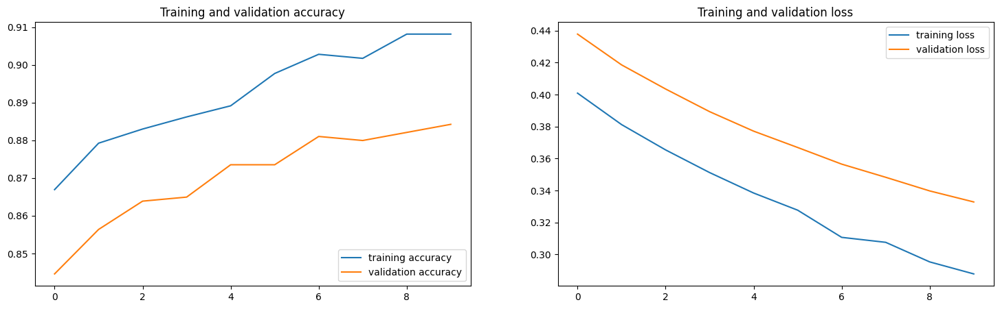

In [89]:
plot_acc_loss(training_history)

In [93]:
model_efficientnet.load_weights("best_model.weights.h5") #add .weights.h5

In [94]:
base_model.trainable = True
model_efficientnet.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 3)              │         3,843 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,061,102 (15.49 MB)

 Trainable params: 4,011,391 (15.30 MB)

 Non-trainable params: 42,023 (164.16 KB)

 Optimizer params: 7,688 (30.04 KB)

In [96]:
checkpoint = tf.keras.callbacks.ModelCheckpoint("best_model.weights.h5",
                                                monitor="val_accuracy",
                                                mode="max",
                                                save_best_only=True,
                                                save_weights_only=True)

earlystopping = tf.keras.callbacks.EarlyStopping(patience=4,
                                                 monitor="val_accuracy",
                                                 restore_best_weights=True)

In [106]:
model_efficientnet.compile(
    optimizer=tf.keras.optimizers.Adam(1e-6),  # Lower learning rate
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [107]:
training_history = model_efficientnet.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10, #change 100 fro 10
    callbacks=[checkpoint, earlystopping]
)

Epoch 1/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 149s 307ms/step - accuracy: 0.6429 - loss: 0.7795 - val_accuracy: 0.7642 - val_loss: 0.6079
Epoch 2/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - accuracy: 0.6976 - loss: 0.7061 - val_accuracy: 0.7546 - val_loss: 0.6274
Epoch 3/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - accuracy: 0.7345 - loss: 0.6452 - val_accuracy: 0.7792 - val_loss: 0.5848
Epoch 4/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - accuracy: 0.7610 - loss: 0.6064 - val_accuracy: 0.8028 - val_loss: 0.5454
Epoch 5/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - accuracy: 0.7949 - loss: 0.5589 - val_accuracy: 0.8242 - val_loss: 0.5104
Epoch 6/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - accuracy: 0.8085 - loss: 0.5226 - val_accuracy: 0.8371 - val_loss: 0.4793
Epoch 7/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - accuracy: 0.8129 - loss: 0.5045 - val_accuracy: 0.8457 - val_loss: 0.4514
Epoch 8/10
234/234 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - accuracy: 0.8515 - loss: 0.45

In [108]:
model_efficientnet.load_weights("best_model.weights.h5")

In [109]:
loss, acc = model_efficientnet.evaluate(test_ds)
print(f"final loss {loss}, final acc {acc}")


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.8897 - loss: 0.3010
final loss 0.367747962474823, final acc 0.84375


# References

1. The [`imgaug`](https://nbviewer.org/github/aleju/imgaug-doc/blob/master/notebooks/A01%20-%20Load%20and%20Augment%20an%20Image.ipynb) library

2. The [`imageio`](https://imageio.readthedocs.io/en/stable/) library